# Contents
* [Introduction](#Introduction)
* [Imports and configuration](#Imports-and-configuration)
* [Data loading](#Data-loading)
* [Setup](#Setup)
* [Linear discriminant analysis of FRILL embeddings](#Linear-discriminant-analysis-of-FRILL-embeddings)
* [One-class linear discriminant analysis of FRILL embeddings](#One-class-linear-discriminant-analysis-of-FRILL-embeddings)
* [Local outlier factor of FRILL embeddings](#Local-outlier-factor-of-FRILL-embeddings)
* [Local outlier factor of LDA components of FRILL embeddings](#Local-outlier-factor-of-LDA-components-of-FRILL-embeddings)
* [One-class SVM scores of FRILL embeddings (and their LDA components) and of the LDA components of the FRILL embeddings](#One-class-SVM-scores-of-FRILL-embeddings-(and-their-LDA-components)-and-of-the-LDA-components-of-the-FRILL-embeddings)

* [Spherical coordinates](#Spherical-coordinates)
* [LDA components of spherical FRILL-based features](#LDA-components-of-spherical-FRILL-based-features)
* [One-class LDA components of spherical FRILL-based features](#One-class-LDA-components-of-spherical-FRILL-based-features)
* [Aggregate and scale](#Aggregate-and-scale)
* [Discussion](#Discussion)

# Introduction

Earlier, the results of feature engineering were assessed with cross validation. This notebook extracts selected FRILL-based features from the whole dataset for prototyping.

In [1]:
from time import time

notebook_begin_time = time()

# set random seeds

from os import environ
from random import seed as random_seed
from numpy.random import seed as np_seed
from tensorflow.random import set_seed


def reset_seeds(seed: int) -> None:
    """Utility function for resetting random seeds"""
    environ["PYTHONHASHSEED"] = str(seed)
    random_seed(seed)
    np_seed(seed)
    set_seed(seed)


reset_seeds(SEED := 2021)
del environ
del random_seed
del np_seed
del set_seed
del reset_seeds

In [2]:
# extensions
%load_ext autotime
%load_ext lab_black
%load_ext nb_black

In [3]:
# core
import numpy as np
import pandas as pd

# utility
from gc import collect as gc_collect
from joblib import dump
from tqdm.notebook import tqdm

# faster sklearn
from sklearnex import patch_sklearn

patch_sklearn()
del patch_sklearn

# typing
from typing import Callable, List, Tuple

# feature engineering
from numpy import arctan2, hypot, sqrt
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import SGDOneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import QuantileTransformer
from sklearn.svm import OneClassSVM

# # feature selection
# from sklearn.ensemble import AdaBoostClassifier
# from sklearn.feature_selection import SelectFromModel
# from sklearn.tree import DecisionTreeClassifier

# visualization
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
# %matplotlib widget
sns.set_theme(context="notebook", style="ticks", palette="colorblind")

# display outputs w/o print calls
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
del InteractiveShell

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


time: 4.11 s


In [4]:
# Location of FRILL .feather files
FRILL_FEATHERS_FOLDER = "../1.0-mic-extract_FRILL_embeddings"

# Location where this notebook will output
DATA_OUT_FOLDER = "."

_ = gc_collect()

time: 139 ms


# Data loading

In [5]:
def load_labels() -> pd.DataFrame:
    """Load just the labels"""
    keep_columns = [
        "id",
        "source",
        "speaker_id",
        "speaker_gender",
        "emo",
        "valence",
        "neg",
        "neu",
        "pos",
        "lang1",
        "length",
    ]
    labels = pd.concat(
        (
            pd.read_feather(
                f"{FRILL_FEATHERS_FOLDER}/dev_labels.feather", columns=keep_columns
            ),
            pd.read_feather(
                f"{FRILL_FEATHERS_FOLDER}/nondev_labels.feather", columns=keep_columns
            ),
        )
    ).set_index("id")
    return labels


def load_data(filepath: str = "", sample: int = 0) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Loads the FRILL data anew by default"""
    data = (
        pd.read_feather(f"{filepath}.feather")
        if filepath
        else pd.concat(
            (
                pd.read_feather(f"{FRILL_FEATHERS_FOLDER}/dev_FRILL.feather"),
                pd.read_feather(f"{FRILL_FEATHERS_FOLDER}/nondev_FRILL.feather"),
            )
        )
    ).set_index("id")
    labels = load_labels()

    if sample:
        labels = labels.sample(n=sample, random_state=SEED)
        data = data.loc[labels.index]
    return data, labels


data, labels = load_data()
frill_columns = data.columns

assert all(data.index == labels.index)
_ = gc_collect()

time: 2.37 s


In [6]:
data.head(1)
data.info()
labels.head(1)
labels.info()

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
id,,,,,,,,,,,,,,,,,,,,,
0,0.119926,-0.049218,0.039702,0.141101,0.044318,0.049631,0.016178,0.025797,-0.104466,-0.016044,...,-0.226529,-0.091773,0.028184,-0.074794,0.025474,0.046511,-0.002693,-0.017953,-0.146394,-0.06233


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 86752 entries, 0 to 87363
Columns: 2048 entries, 0 to 2047
dtypes: float32(2048)
memory usage: 678.4 MB


,source,speaker_id,speaker_gender,emo,valence,neg,neu,pos,lang1,length
id,,,,,,,,,,
0,aesdd,aesdd.1,f,ang,0,True,False,False,ell,medium


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 86752 entries, 0 to 87363
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   source          86752 non-null  category
 1   speaker_id      86752 non-null  category
 2   speaker_gender  86752 non-null  category
 3   emo             86752 non-null  category
 4   valence         86752 non-null  int8    
 5   neg             86752 non-null  bool    
 6   neu             86752 non-null  bool    
 7   pos             86752 non-null  bool    
 8   lang1           86752 non-null  category
 9   length          86752 non-null  category
dtypes: bool(3), category(6), int8(1)
memory usage: 1.6 MB
time: 264 ms


# Setup

In [7]:
# valence label codes
VALENCE = {"neg": 0, "neu": 1, "pos": 2}

# ternary to binary labels per class
RECODER = {
    "neg": lambda y: ((y - 1) // 2) * (-1),
    "neu": lambda y: y % 2,
    "pos": lambda y: y // 2,
}

_ = gc_collect()

time: 132 ms


In [8]:
def plot1d(data: pd.DataFrame, labels: pd.DataFrame, x: str) -> None:
    sns.displot(
        x=data[x],
        hue=labels.valence,
        palette="viridis",
        linewidth=0,
        alpha=0.75,
        legend=False,
    )
    sns.despine(top=True, right=True)
    plt.tight_layout()
    plt.show()


_ = -gc_collect()

time: 135 ms


In [9]:
def plot2d(data: pd.DataFrame, labels: pd.DataFrame, x: str, y: str) -> None:
    """Scatterplot of two variables"""
    _ = sns.histplot(
        x=data[x],
        y=data[y],
        cmap="RdPu",
        linewidth=0,
        alpha=0.2,
        legend=False,
        kde=True,
    )
    _ = sns.scatterplot(
        x=data[x],
        y=data[y],
        hue=labels.valence,
        palette="viridis",
        linewidth=0,
        alpha=0.75,
        legend=False,
        s=10,
    )
    sns.despine(**dict.fromkeys("top right left bottom".split(), True))
    plt.show()


_ = gc_collect()

time: 120 ms


In [10]:
def plot3d(data: pd.DataFrame, labels: pd.DataFrame, x: str, y: str, z: str) -> None:
    """Scatterplot of three variables"""
    fig = plt.figure(figsize=(7, 7))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(
        data[x],
        data[y],
        data[z],
        alpha=0.5,
        linewidth=0,
        cmap="viridis",
        c=labels.valence,
    )
    ax.grid(False)
    plt.show()


_ = gc_collect()

time: 138 ms


In [11]:
def checkpoint_features(df: pd.DataFrame, features: List[str]) -> None:
    """Save features to disk as a .feather dataframe"""
    df = df.loc[:, features]
    df.columns = df.columns.astype(str)
    try:
        df.to_feather(
            _ := f"{DATA_OUT_FOLDER}/{'_-_'.join(features) if len(features) > 1 else features[0]}.feather"
        )
    except ValueError:
        df.reset_index().to_feather(_)


_ = gc_collect()

time: 137 ms


# Linear discriminant analysis of FRILL embeddings

In [12]:
data, labels = load_data()

time: 1.92 s


['./LDA1_-_LDA2.joblib']

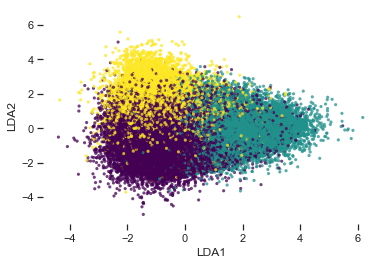

time: 1min 18s


In [13]:
lda = LinearDiscriminantAnalysis().fit(data, labels.valence)
dump(lda, f"{DATA_OUT_FOLDER}/LDA1_-_LDA2.joblib")
features = ["LDA1", "LDA2"]
data = pd.DataFrame(lda.transform(data), columns=features)
data.index = labels.index
del lda
_ = gc_collect()
assert not data.isnull().values.any()
plot2d(data, labels, *features)
checkpoint_features(data, features)  # LDA1_-_LDA2.feather

# One-class linear discriminant analysis of FRILL embeddings

In [14]:
data, labels = load_data()

time: 1.45 s


I went back and fixed this

[//]: # (Edit: There's a minor bug in the cell below that I caught only when extracting features from the holdout data. Instead of each of these one-class features being extracted from the 2,048 FRILL columns, only the first one processed was (neg). The next one (neu) would be extracted from 2,048 FRILL columns + 1 column for the score just extracted and the third one is thus trained on 2,050 columns. This isn't necessarily a problem since it doesn't induce leakage anywhere; it just means that one of these features may represent more information than the other two. There is some penalty to interpretability, but the FRILL embeddings are already a black box.)

['./ocLDA_neg.joblib']

['./ocLDA_neu.joblib']

['./ocLDA_pos.joblib']

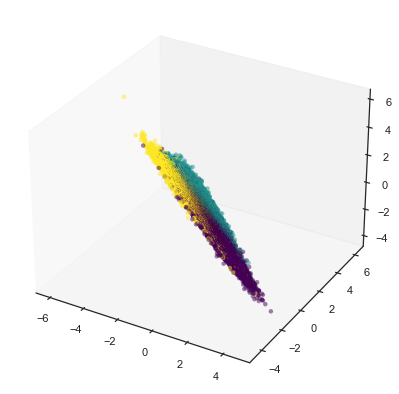

time: 3min 46s


In [15]:
# for valence in VALENCE.keys():
#     feature = f"ocLDA_{valence}"
#     lda = LinearDiscriminantAnalysis().fit(data, RECODER[valence](labels.valence))
#     data[feature] = np.squeeze(lda.transform(data))
#     dump(lda, f"{DATA_OUT_FOLDER}/{feature}.joblib")
#     del feature
#     del lda
#     _ = gc_collect()
# features = ["ocLDA_neg", "ocLDA_neu", "ocLDA_pos"]
# checkpoint_features(data, features)
# plot3d(data, labels, *features)
#
# assert not data.isnull().values.any()
# _ = gc_collect()

for valence in VALENCE.keys():
    feature = f"ocLDA_{valence}"
    lda = LinearDiscriminantAnalysis().fit(
        data.loc[:, frill_columns], RECODER[valence](labels.valence)
    )
    data[feature] = np.squeeze(lda.transform(data.loc[:, frill_columns]))
    dump(lda, f"{DATA_OUT_FOLDER}/{feature}.joblib")
    del feature
    del lda
    _ = gc_collect()
features = ["ocLDA_neg", "ocLDA_neu", "ocLDA_pos"]
checkpoint_features(data, features)
plot3d(data, labels, *features)

assert not data.isnull().values.any()
_ = gc_collect()

# Local outlier factor of FRILL embeddings

In [16]:
data, labels = load_data()

time: 1.65 s


In [17]:
def add_LOF_PCA_columns(df: pd.DataFrame, emo: str, prefix: str = None) -> pd.DataFrame:
    """Adds a principal component column for a given valence's LOF scores"""
    prefix = f"{f'{prefix}-' if prefix else ''}LOF_{emo}"
    columns = [f"{prefix}_{k}" for k in (10, 20, 30)]
    pca = PCA(n_components=1, random_state=SEED).fit(df[columns])
    dump(pca, f"{DATA_OUT_FOLDER}/{prefix}_PCA.joblib")
    df[f"{prefix}_PCA"] = pca.transform(df[columns])
    return df


_ = gc_collect()

time: 137 ms


['./LOF_neg_10.joblib']

['./LOF_neu_10.joblib']

['./LOF_pos_10.joblib']

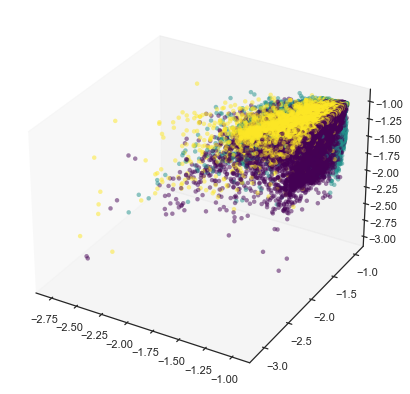

['./LOF_neg_20.joblib']

['./LOF_neu_20.joblib']

['./LOF_pos_20.joblib']

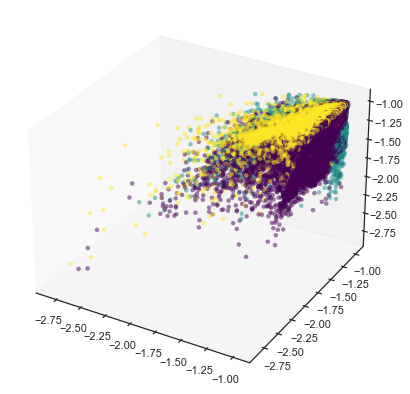

['./LOF_neg_30.joblib']

['./LOF_neu_30.joblib']

['./LOF_pos_30.joblib']

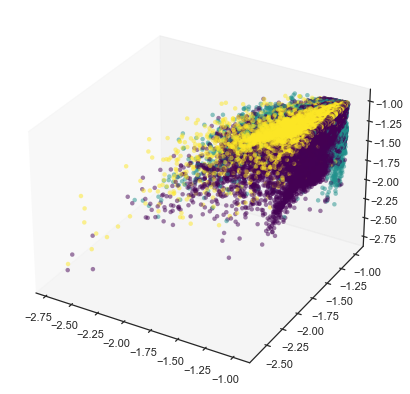

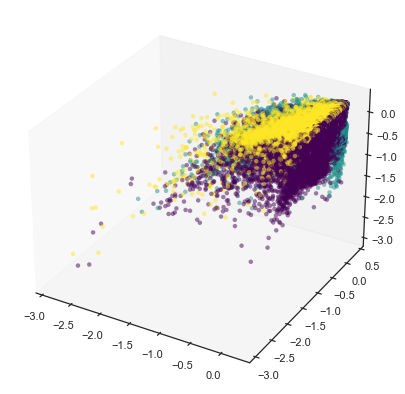

time: 32min 48s


In [18]:
for n_neighbors in (10, 20, 30):
    for emo in ("neg", "neu", "pos"):
        valence = VALENCE[emo]
        key = f"LOF_{emo}_{n_neighbors}"
        data[key] = np.nan
        lof = LocalOutlierFactor(n_neighbors, novelty=True, n_jobs=-1).fit(
            data.loc[labels.valence == valence, frill_columns].values
        )
        data.loc[labels.valence == valence, key] = lof.negative_outlier_factor_
        data.loc[labels.valence != valence, key] = lof.score_samples(
            data.loc[labels.valence != valence, frill_columns].values
        )
        dump(lof, f"{DATA_OUT_FOLDER}/{key}.joblib")
        del valence
        del key
        del lof
        _ = gc_collect()
    features = [
        f"LOF_neg_{n_neighbors}",
        f"LOF_neu_{n_neighbors}",
        f"LOF_pos_{n_neighbors}",
    ]
    checkpoint_features(data, features)
    plot3d(data, labels, *features)
    del features
    _ = gc_collect()

for valence in VALENCE.keys():
    data = add_LOF_PCA_columns(df=data, emo=valence)

features = ["LOF_neg_PCA", "LOF_neu_PCA", "LOF_pos_PCA"]
plot3d(data, labels, *features)
checkpoint_features(data, features)

# Local outlier factor of LDA components of FRILL embeddings

In [19]:
data, labels = load_data(filepath=f"{DATA_OUT_FOLDER}/LDA1_-_LDA2")
# labels = labels.loc[data.index]

time: 101 ms


['./LDA-LOF_neg_10.joblib']

['./LDA-LOF_neu_10.joblib']

['./LDA-LOF_pos_10.joblib']

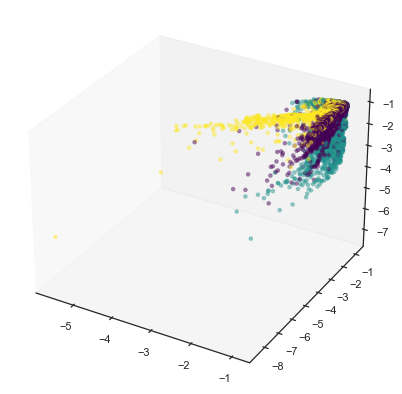

['./LDA-LOF_neg_20.joblib']

['./LDA-LOF_neu_20.joblib']

['./LDA-LOF_pos_20.joblib']

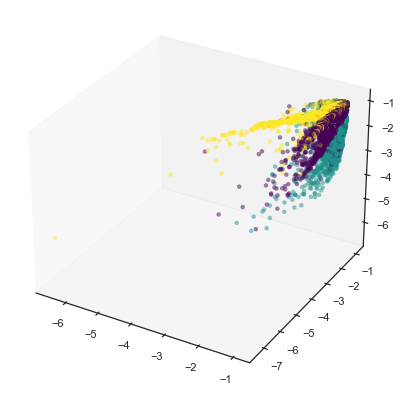

['./LDA-LOF_neg_30.joblib']

['./LDA-LOF_neu_30.joblib']

['./LDA-LOF_pos_30.joblib']

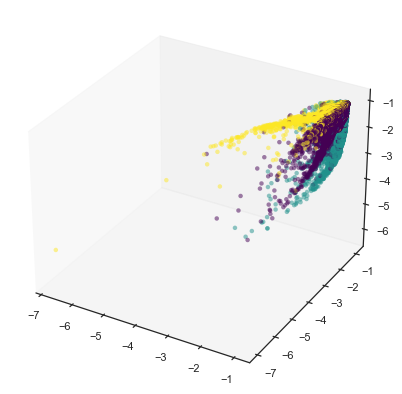

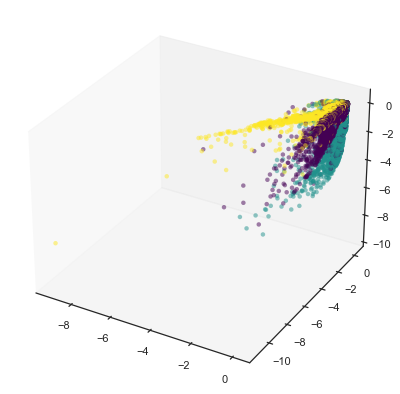

time: 9.96 s


In [20]:
for n_neighbors in (10, 20, 30):
    for emo in ("neg", "neu", "pos"):
        valence = VALENCE[emo]
        key = f"LDA-LOF_{emo}_{n_neighbors}"
        data[key] = np.nan
        lof = LocalOutlierFactor(n_neighbors, novelty=True, n_jobs=-1).fit(
            data.loc[labels.valence == valence, ["LDA1", "LDA2"]].values
        )
        data.loc[labels.valence == valence, key] = lof.negative_outlier_factor_
        data.loc[labels.valence != valence, key] = lof.score_samples(
            data.loc[labels.valence != valence, ["LDA1", "LDA2"]].values
        )
        dump(lof, f"{DATA_OUT_FOLDER}/{key}.joblib")
        del valence
        del key
        del lof
        _ = gc_collect()
    features = [
        f"LDA-LOF_neg_{n_neighbors}",
        f"LDA-LOF_neu_{n_neighbors}",
        f"LDA-LOF_pos_{n_neighbors}",
    ]
    plot3d(data, labels, *features)
    checkpoint_features(data, features)
    del features
    _ = gc_collect()

for valence in VALENCE.keys():
    data = add_LOF_PCA_columns(data, valence, prefix="LDA")

features = ["LDA-LOF_neg_PCA", "LDA-LOF_neu_PCA", "LDA-LOF_pos_PCA"]
plot3d(data, labels, *features)
checkpoint_features(data, features)

In [21]:
del add_LOF_PCA_columns
_ = gc_collect()

time: 135 ms


# One-class SVM scores of FRILL embeddings (and their LDA components) and of the LDA components of the FRILL embeddings

In [22]:
def extract_ocsvm_features(
    df: pd.DataFrame, labels: pd.DataFrame, model_base: Callable, descriptor: str
) -> pd.DataFrame:
    """Extract features using the given one-class SVM base"""
    prefix = f"ocSVM_{descriptor}"
    # one-class scores of FRILL embeddings
    print(f"extracting one-class {descriptor} scores of FRILL embeddings...")
    for valence in VALENCE.keys():
        classifier = model_base().fit(
            df.loc[labels.valence == VALENCE[valence], frill_columns]
        )
        feature = f"{prefix}_{valence}"
        df[feature] = classifier.score_samples(df.loc[:, frill_columns])
        dump(classifier, f"{DATA_OUT_FOLDER}/{feature}.joblib")
        del classifier
        del feature
        _ = gc_collect()
    assert all(df.index == labels.index)
    features = [f"{prefix}_neg", f"{prefix}_neu", f"{prefix}_pos"]
    plot3d(df, labels, *features)
    checkpoint_features(df, features)

    # LDA components of one-class scores of FRILL embeddings
    print(
        f"extracting LDA components of one-class {descriptor} scores of FRILL embeddings..."
    )
    lda = LinearDiscriminantAnalysis().fit(df_ := df.loc[:, features], labels.valence)
    assert all(df.index == df_.index)
    df_ = pd.DataFrame(lda.transform(df_), columns=[f"{prefix}_LDA1", f"{prefix}_LDA2"])
    df_.index = df.index
    df = pd.concat([df, df_], axis="columns")
    assert all(df.index == labels.index)
    dump(lda, f"{DATA_OUT_FOLDER}/{prefix}_LDA1_-_{prefix}_LDA2.joblib")
    del df_
    del lda
    _ = gc_collect()
    features = [f"{prefix}_LDA1", f"{prefix}_LDA2"]
    plot2d(df, labels, *features)
    checkpoint_features(df, features)

    # one-class scores of LDA components of FRILL embeddings
    print("extracting one-class scores of LDA components of FRILL embeddings...")
    for valence in VALENCE.keys():
        classifier = model_base().fit(
            df.loc[labels.valence == VALENCE[valence], ["LDA1", "LDA2"]]
        )
        feature = f"LDA-{prefix}_{valence}"
        df[feature] = classifier.score_samples(df.loc[:, ["LDA1", "LDA2"]])
        dump(classifier, f"{DATA_OUT_FOLDER}/{feature}.joblib")
        del classifier
        del feature
        _ = gc_collect()
    assert all(df.index == labels.index)
    features = [f"LDA-{prefix}_neg", f"LDA-{prefix}_neu", f"LDA-{prefix}_pos"]
    plot3d(df, labels, *features)
    checkpoint_features(df, features)

    return df


_ = gc_collect()

time: 129 ms


In [23]:
data, labels = load_data()
data = pd.concat(
    [data, pd.read_feather(f"{DATA_OUT_FOLDER}/LDA1_-_LDA2.feather").set_index("id")],
    axis="columns",
)
assert all(data.index == labels.index)

time: 2.67 s


In [24]:
# already_completed = []
oc_svms = {
    "sgdlinear": lambda: SGDOneClassSVM(random_state=SEED),
    "rbf": lambda: OneClassSVM(kernel="rbf"),
    "sigmoid": lambda: OneClassSVM(kernel="sigmoid"),
    "poly5": lambda: OneClassSVM(kernel="poly", degree=5),
    "poly6": lambda: OneClassSVM(kernel="poly", degree=6),
    # **{f"poly{deg}": lambda: OneClassSVM(kernel="poly", degree=deg) for deg in range(2, 7)},
}
_ = gc_collect()

time: 144 ms


  0%|          | 0/5 [00:00<?, ?it/s]

extracting one-class sgdlinear scores of FRILL embeddings...


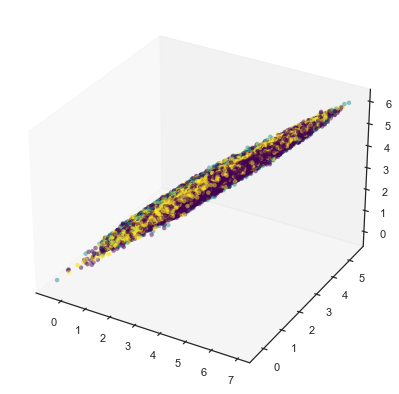

extracting LDA components of one-class sgdlinear scores of FRILL embeddings...


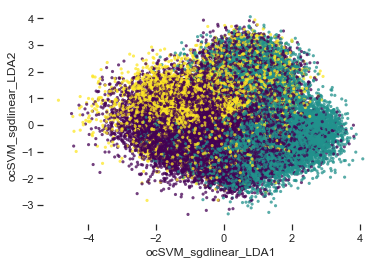

extracting one-class scores of LDA components of FRILL embeddings...


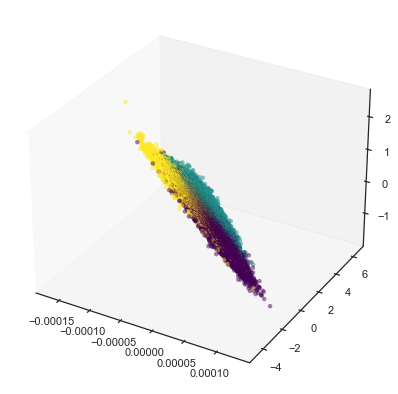

extracting one-class rbf scores of FRILL embeddings...


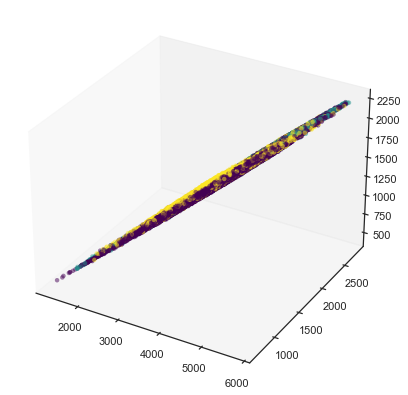

extracting LDA components of one-class rbf scores of FRILL embeddings...


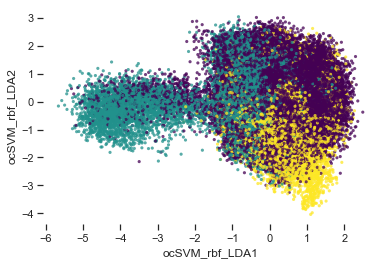

extracting one-class scores of LDA components of FRILL embeddings...


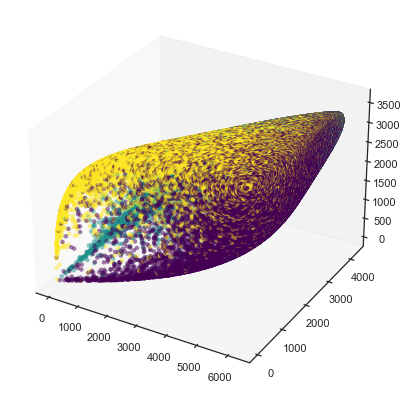

extracting one-class sigmoid scores of FRILL embeddings...


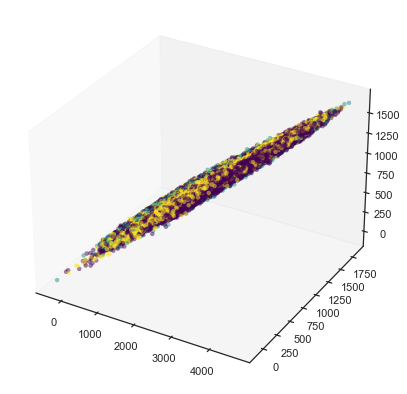

extracting LDA components of one-class sigmoid scores of FRILL embeddings...


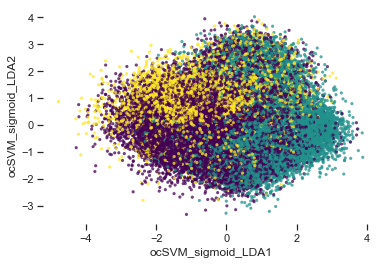

extracting one-class scores of LDA components of FRILL embeddings...


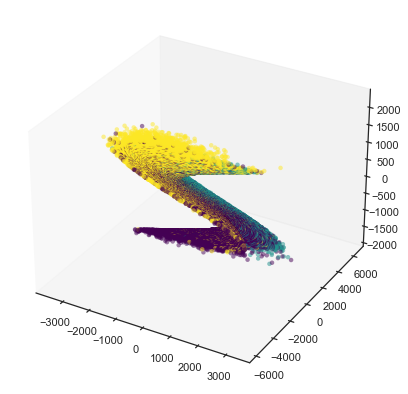

extracting one-class poly5 scores of FRILL embeddings...


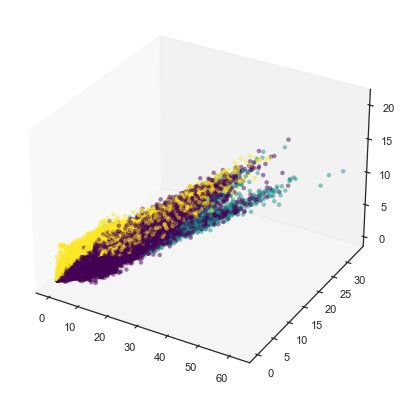

extracting LDA components of one-class poly5 scores of FRILL embeddings...


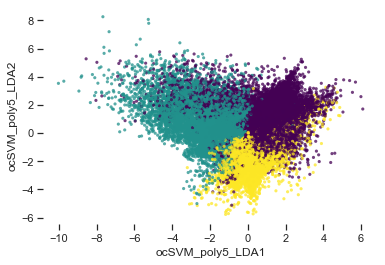

extracting one-class scores of LDA components of FRILL embeddings...


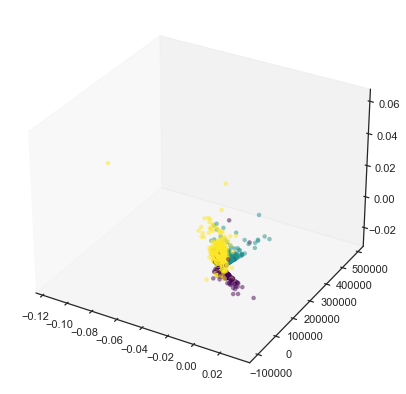

extracting one-class poly6 scores of FRILL embeddings...


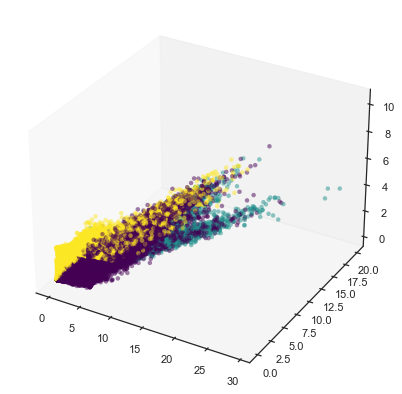

extracting LDA components of one-class poly6 scores of FRILL embeddings...


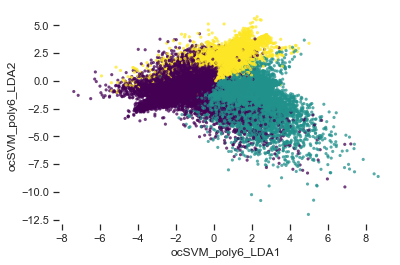

extracting one-class scores of LDA components of FRILL embeddings...


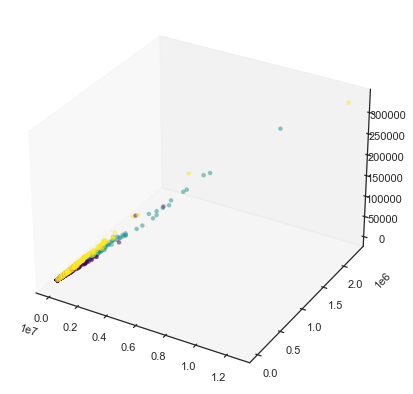

time: 1d 2h 52min 3s


In [25]:
plt.close("all")
for oc_svm, model_base in tqdm(oc_svms.items()):
    # if oc_svm in already_completed:
    #     continue
    data = extract_ocsvm_features(data, labels, model_base, oc_svm)

In [26]:
# scalers = {
#     None: lambda: None,
#     "StSc": lambda: StandardScaler(),
#     "YJ-StSc": lambda: PowerTransformer(
#         method="yeo-johnson", standardize=True
#     ),  # default
#     "QT-unif": lambda: QuantileTransformer(
#         output_distribution="uniform", random_state=SEED
#     ),
#     "QT-norm": lambda: QuantileTransformer(
#         output_distribution="normal", random_state=SEED
#     ),
# }

_ = gc_collect()

time: 102 ms


# Spherical coordinates

NB: We are dropping the rho coordinates

In [27]:
features_ = [["LDA1", "LDA2"], ["ocLDA_neg", "ocLDA_neu", "ocLDA_pos"]]

for n_neighbors in (10, 20, 30):
    features_.extend(
        [
            [
                f"LDA-LOF_neg_{n_neighbors}",
                f"LDA-LOF_neu_{n_neighbors}",
                f"LDA-LOF_pos_{n_neighbors}",
            ],
            [
                f"LOF_neg_{n_neighbors}",
                f"LOF_neu_{n_neighbors}",
                f"LOF_pos_{n_neighbors}",
            ],
        ]
    )
features_.extend(
    [
        [f"LDA-LOF_neg_PCA", f"LDA-LOF_neu_PCA", f"LDA-LOF_pos_PCA"],
        [f"LOF_neg_PCA", f"LOF_neu_PCA", f"LOF_pos_PCA"],
    ]
)
for descriptor in oc_svms.keys():
    features_.extend(
        [
            [
                f"ocSVM_{descriptor}_neg",
                f"ocSVM_{descriptor}_neu",
                f"ocSVM_{descriptor}_pos",
            ],
            [f"ocSVM_{descriptor}_LDA1", f"ocSVM_{descriptor}_LDA2"],
            [
                f"LDA-ocSVM_{descriptor}_neg",
                f"LDA-ocSVM_{descriptor}_neu",
                f"LDA-ocSVM_{descriptor}_pos",
            ],
        ]
    )

_ = gc_collect()

time: 99.9 ms


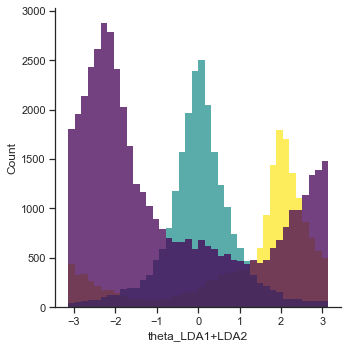

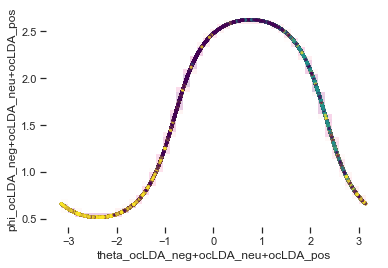

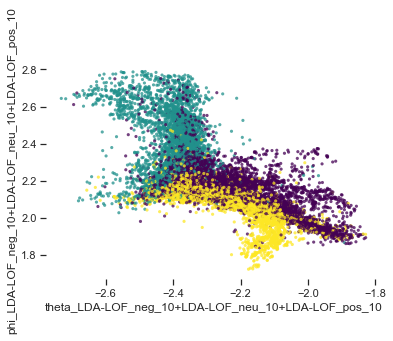

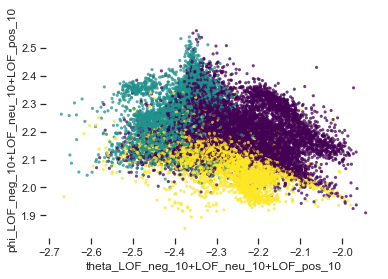

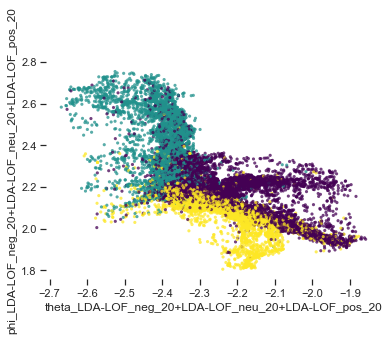

...

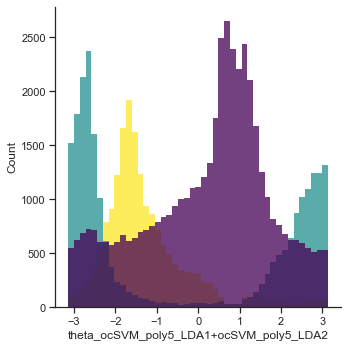

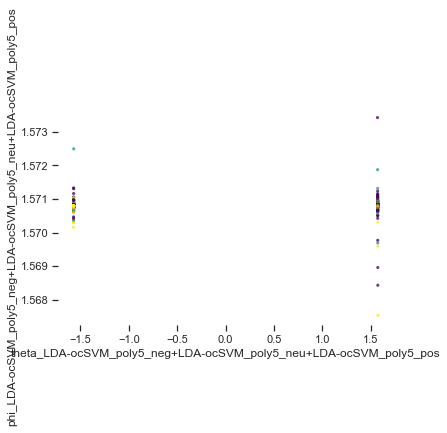

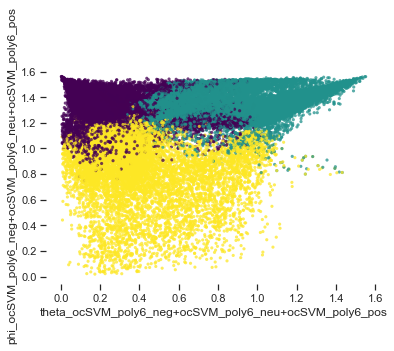

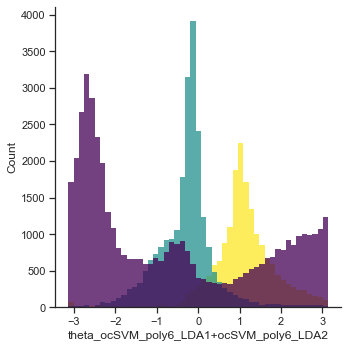

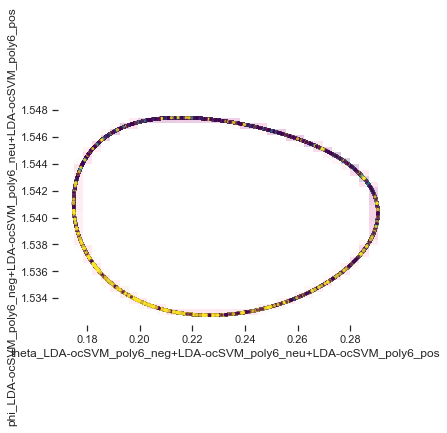

time: 41.4 s


In [28]:
# potential outer scaling loop omitted
# rho coordinate omitted
sphericals = {}
for features in features_:
    combo = "+".join(features)
    # cols = [f"rho_{combo}", f"theta_{combo}"]
    df = pd.read_feather(f"{DATA_OUT_FOLDER}/{'_-_'.join(features)}.feather").set_index(
        "id"
    )
    labels = load_labels().loc[df.index]
    x, y = df[features[0]], df[features[1]]
    theta, phi = f"theta_{combo}", f"phi_{combo}"
    sphericals[theta] = arctan2(y, x)
    # convert to polar
    if len(features) == 3:
        # z = df[features[2]]
        # cols.append(f"phi_{combo}")
        # xy = x ** 2 + y ** 2
        # sphericals[cols[0]] = sqrt(xy + z ** 2)
        # sphericals[cols[1]] = arctan2(sqrt(xy), z)
        # sphericals[cols[2]] = arctan2(y, x)
        # sphericals[f"phi_{combo}"] = arctan2(sqrt(x ** 2 + y ** 2), z)
        sphericals[phi] = arctan2(sqrt(x ** 2 + y ** 2), df[features[2]])
        plot2d(
            pd.DataFrame({theta: sphericals[theta], phi: sphericals[phi]}),
            labels,
            theta,
            phi,
        )
    else:
        plot1d(pd.DataFrame({theta: sphericals[theta]}), labels, theta)
        # sphericals[cols[0]] = hypot(x, y)
        # rho term is omitted
        # sphericals[cols[1]] = arctan2(y, x)
    del df
    del x
    del y
    del combo
    _ = gc_collect()

pd.DataFrame(sphericals).reset_index().to_feather(
    f"{DATA_OUT_FOLDER}/spherical_features.feather"
)
del features_
del sphericals
_ = gc_collect()

# LDA components of spherical FRILL-based features

In [29]:
data, labels = load_data(filepath=f"{DATA_OUT_FOLDER}/spherical_features")
# labels = labels.loc[data.index]

time: 127 ms


['./spherical-LDA1_-_spherical-LDA2.joblib']

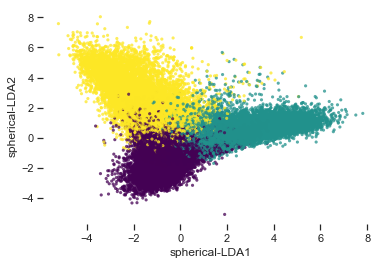

time: 1.64 s


In [30]:
lda = LinearDiscriminantAnalysis().fit(data, labels.valence)
dump(lda, f"{DATA_OUT_FOLDER}/spherical-LDA1_-_spherical-LDA2.joblib")
features = ["spherical-LDA1", "spherical-LDA2"]
df = pd.DataFrame(lda.transform(data), columns=features)
df.index = data.index
del data
del lda
_ = gc_collect()
plot2d(df, labels, *features)
checkpoint_features(df, features)

# One-class LDA components of spherical FRILL-based features

In [31]:
data, labels = load_data(filepath=f"{DATA_OUT_FOLDER}/spherical_features")
# labels = labels.loc[data.index]

time: 57.2 ms


['./spherical-ocLDA_neg.joblib']

['./spherical-ocLDA_neu.joblib']

['./spherical-ocLDA_pos.joblib']

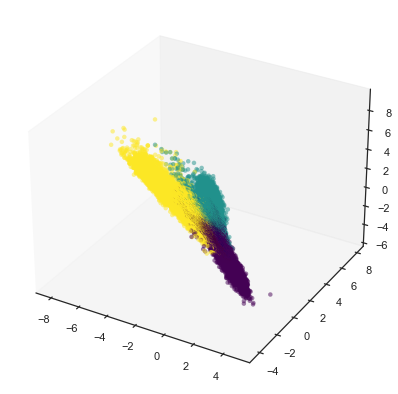

time: 2.98 s


In [32]:
df = {}
features = []
for valence in VALENCE:
    features.append(feature := f"spherical-ocLDA_{valence}")
    lda = LinearDiscriminantAnalysis().fit(data, RECODER[valence](labels.valence))
    dump(lda, f"{DATA_OUT_FOLDER}/{feature}.joblib")
    df[feature] = np.squeeze(lda.transform(data))
    del feature
    del lda
    _ = gc_collect()
df = pd.DataFrame(df, columns=features)
df.index = data.index
plot3d(df, labels, *features)
checkpoint_features(df, features)
del df
del features
_ = gc_collect()

# Aggregate and scale

In [33]:
features = [
    [f"spherical-ocLDA_{valence}" for valence in VALENCE],
    ["spherical-LDA1", "spherical-LDA2"],
    ["LDA1", "LDA2"],
    ["ocLDA_neg", "ocLDA_neu", "ocLDA_pos"],
]
for n_neighbors in (10, 20, 30):
    features.extend(
        [
            [
                f"LDA-LOF_neg_{n_neighbors}",
                f"LDA-LOF_neu_{n_neighbors}",
                f"LDA-LOF_pos_{n_neighbors}",
            ],
            [
                f"LOF_neg_{n_neighbors}",
                f"LOF_neu_{n_neighbors}",
                f"LOF_pos_{n_neighbors}",
            ],
        ]
    )
features.extend(
    [
        [f"LDA-LOF_neg_PCA", f"LDA-LOF_neu_PCA", f"LDA-LOF_pos_PCA"],
        [f"LOF_neg_PCA", f"LOF_neu_PCA", f"LOF_pos_PCA"],
    ]
)
for descriptor in oc_svms.keys():
    features.extend(
        [
            [
                f"ocSVM_{descriptor}_neg",
                f"ocSVM_{descriptor}_neu",
                f"ocSVM_{descriptor}_pos",
            ],
            [f"ocSVM_{descriptor}_LDA1", f"ocSVM_{descriptor}_LDA2"],
            [
                f"LDA-ocSVM_{descriptor}_neg",
                f"LDA-ocSVM_{descriptor}_neu",
                f"LDA-ocSVM_{descriptor}_pos",
            ],
        ]
    )

data = pd.concat(
    [pd.read_feather(f"{DATA_OUT_FOLDER}/spherical_features.feather").set_index("id")]
    + [
        pd.read_feather(f"{DATA_OUT_FOLDER}/{fname}.feather").set_index("id")
        for fname in ["_-_".join(features_) for features_ in features]
    ],
    axis="columns",
)
labels = load_labels()
# labels = labels.loc[data.index]

time: 282 ms


In [34]:
scaler = QuantileTransformer(output_distribution="uniform", random_state=SEED).fit(data)
dump(scaler, f"{DATA_OUT_FOLDER}/preselect_QTuni.joblib")
data = pd.DataFrame(scaler.transform(data), columns=scaler.feature_names_in_)
data.index = labels.index
data.reset_index().to_feather(f"{DATA_OUT_FOLDER}/features_ready_for_selection.feather")

['./preselect_QTuni.joblib']

time: 2.13 s


In [35]:
data = pd.read_feather(f"{DATA_OUT_FOLDER}/features_ready_for_selection.feather")
data.head()
data.info()
data.describe()
data.columns
data.index

,id,theta_LDA1+LDA2,theta_ocLDA_neg+ocLDA_neu+ocLDA_pos,phi_ocLDA_neg+ocLDA_neu+ocLDA_pos,theta_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,phi_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,theta_LOF_neg_10+LOF_neu_10+LOF_pos_10,phi_LOF_neg_10+LOF_neu_10+LOF_pos_10,theta_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,phi_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,...,LDA-ocSVM_poly5_neu,LDA-ocSVM_poly5_pos,ocSVM_poly6_neg,ocSVM_poly6_neu,ocSVM_poly6_pos,ocSVM_poly6_LDA1,ocSVM_poly6_LDA2,LDA-ocSVM_poly6_neg,LDA-ocSVM_poly6_neu,LDA-ocSVM_poly6_pos
0,0,0.073873,0.321372,0.465914,0.075296,0.130801,0.887905,0.395910,0.479188,0.183678,...,0.501156,0.551483,0.453227,0.219205,0.376734,0.057822,0.157090,0.069607,0.072289,0.065946
1,2,0.919642,0.167050,0.188923,0.932888,0.053331,0.925556,0.220154,0.878030,0.133746,...,0.332605,0.696563,0.498408,0.191615,0.347288,0.017573,0.079378,0.331527,0.348119,0.351122
2,4,0.131895,0.379291,0.583655,0.800285,0.546905,0.689251,0.854253,0.697804,0.727970,...,0.389542,0.427190,0.231145,0.134010,0.208721,0.290732,0.334480,0.255693,0.254469,0.239997
3,6,0.994092,0.241499,0.316527,0.925133,0.072650,0.886974,0.253849,0.914084,0.067675,...,0.156769,0.853024,0.639510,0.398827,0.599238,0.085018,0.544632,0.605715,0.632540,0.606309
4,8,0.060363,0.307824,0.440240,0.661346,0.180971,0.845229,0.493938,0.827648,0.056282,...,0.179152,0.748909,0.400961,0.240473,0.351448,0.103522,0.203877,0.581775,0.596079,0.565289


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86752 entries, 0 to 86751
Columns: 119 entries, id to LDA-ocSVM_poly6_pos
dtypes: float64(118), uint64(1)
memory usage: 78.8 MB


,id,theta_LDA1+LDA2,theta_ocLDA_neg+ocLDA_neu+ocLDA_pos,phi_ocLDA_neg+ocLDA_neu+ocLDA_pos,theta_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,phi_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,theta_LOF_neg_10+LOF_neu_10+LOF_pos_10,phi_LOF_neg_10+LOF_neu_10+LOF_pos_10,theta_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,phi_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,...,LDA-ocSVM_poly5_neu,LDA-ocSVM_poly5_pos,ocSVM_poly6_neg,ocSVM_poly6_neu,ocSVM_poly6_pos,ocSVM_poly6_LDA1,ocSVM_poly6_LDA2,LDA-ocSVM_poly6_neg,LDA-ocSVM_poly6_neu,LDA-ocSVM_poly6_pos
count,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,...,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000,86752.000000
mean,43596.367185,0.500001,0.500001,0.499999,0.499999,0.500000,0.500000,0.500000,0.500001,0.500001,...,0.500000,0.500000,0.499999,0.499999,0.499999,0.500001,0.500000,0.499996,0.499996,0.499998
std,25168.733654,0.288681,0.288679,0.288681,0.288679,0.288680,0.288678,0.288677,0.288677,0.288679,...,0.288677,0.288674,0.288679,0.288680,0.288680,0.288676,0.288679,0.288680,0.288680,0.288680
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21829.750000,0.250042,0.250041,0.250051,0.249963,0.250012,0.250008,0.249939,0.249993,0.249975,...,0.250015,0.249981,0.250050,0.250026,0.250015,0.250064,0.250046,0.250046,0.250039,0.249949
50%,43517.500000,0.500040,0.499947,0.499939,0.500035,0.500051,0.499963,0.499965,0.499971,0.500107,...,0.500023,0.499958,0.499948,0.500025,0.500002,0.499905,0.499919,0.500067,0.499966,0.499915
75%,65322.250000,0.749950,0.750026,0.749955,0.750030,0.749997,0.749986,0.750018,0.749983,0.750051,...,0.749967,0.749992,0.749982,0.750009,0.749993,0.749909,0.750004,0.750099,0.750118,0.750057
max,87363.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Index(['id', 'theta_LDA1+LDA2', 'theta_ocLDA_neg+ocLDA_neu+ocLDA_pos',
       'phi_ocLDA_neg+ocLDA_neu+ocLDA_pos',
       'theta_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10',
       'phi_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10',
       'theta_LOF_neg_10+LOF_neu_10+LOF_pos_10',
       'phi_LOF_neg_10+LOF_neu_10+LOF_pos_10',
       'theta_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20',
       'phi_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20',
       ...
       'LDA-ocSVM_poly5_neu', 'LDA-ocSVM_poly5_pos', 'ocSVM_poly6_neg',
       'ocSVM_poly6_neu', 'ocSVM_poly6_pos', 'ocSVM_poly6_LDA1',
       'ocSVM_poly6_LDA2', 'LDA-ocSVM_poly6_neg', 'LDA-ocSVM_poly6_neu',
       'LDA-ocSVM_poly6_pos'],
      dtype='object', length=119)

RangeIndex(start=0, stop=86752, step=1)

time: 755 ms


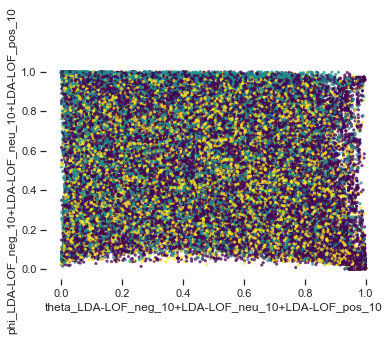

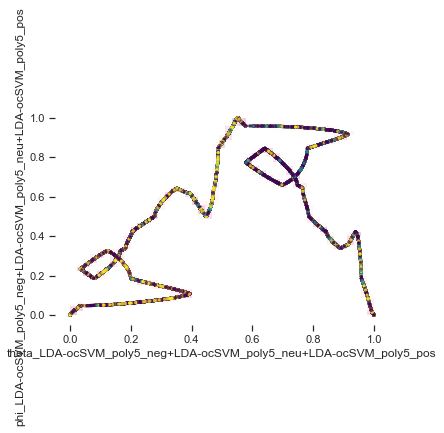

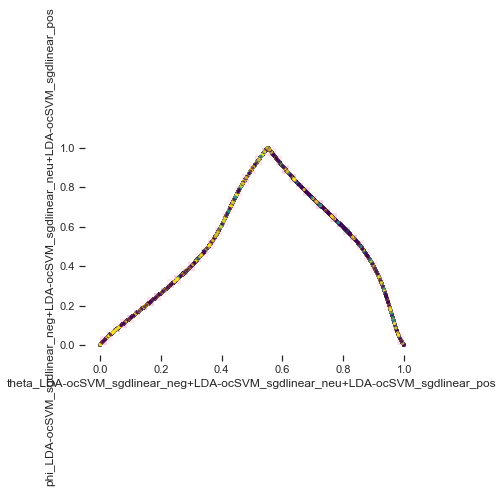

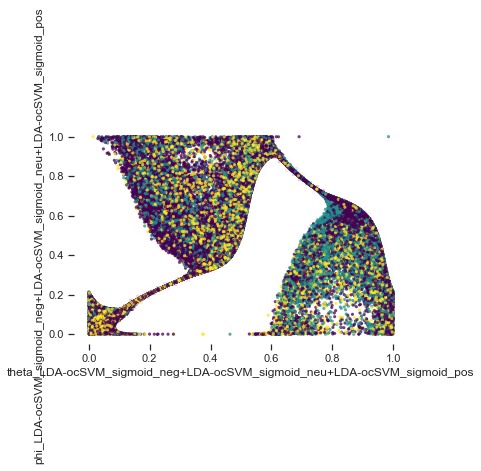

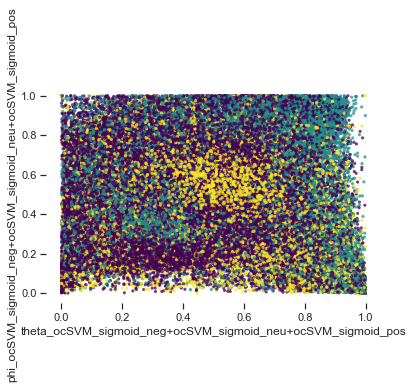

...

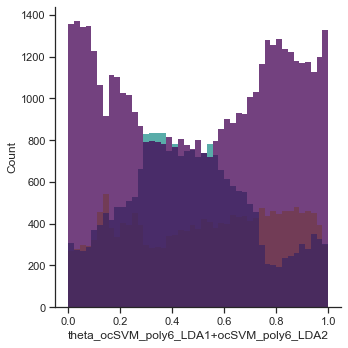

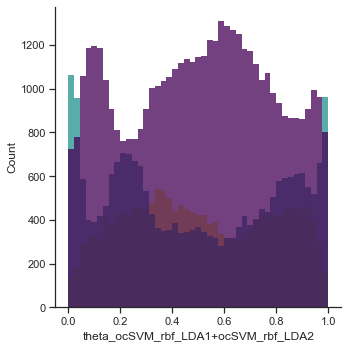

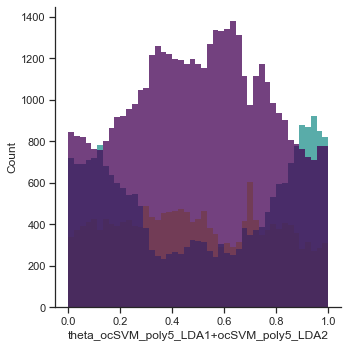

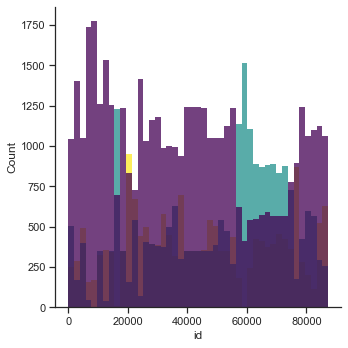

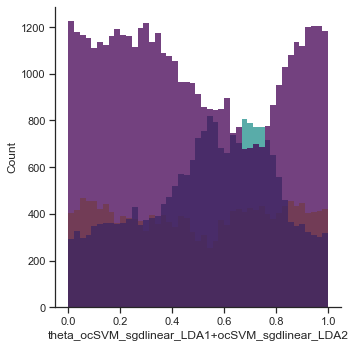

time: 40.5 s


In [36]:
data_columns = set(data.columns)
phi_features = [feature for feature in data_columns if "phi" in feature]
theta_features = []
for phi_feature in phi_features:
    theta_features.append(theta_feature := phi_feature.replace("phi", "theta"))
    plot2d(data, labels, theta_feature, phi_feature)
plotter = {2: plot2d, 3: plot3d}
_ = []
for features_ in features:
    plotter[len(features_)](data, labels, *features_)
    _.extend(features_)
for remaining_column in data_columns - set(phi_features + theta_features + _):
    if "spherical" in remaining_column:
        continue
    plot1d(data, labels, remaining_column)

# Unscaled

I read that although GaussianNB is sensitive to outliers, it is insensitive to scaling. I also read that RF is insensitive to scaling. Those visualizations look pretty bad after scaling. I'm gonna trust my hunch and save a copy of the data without scaling. However, tree-based feature importances may be influenced by scaling.

In [39]:
features = [
    [f"spherical-ocLDA_{valence}" for valence in VALENCE],
    ["spherical-LDA1", "spherical-LDA2"],
    ["LDA1", "LDA2"],
    ["ocLDA_neg", "ocLDA_neu", "ocLDA_pos"],
]
for n_neighbors in (10, 20, 30):
    features.extend(
        [
            [
                f"LDA-LOF_neg_{n_neighbors}",
                f"LDA-LOF_neu_{n_neighbors}",
                f"LDA-LOF_pos_{n_neighbors}",
            ],
            [
                f"LOF_neg_{n_neighbors}",
                f"LOF_neu_{n_neighbors}",
                f"LOF_pos_{n_neighbors}",
            ],
        ]
    )
features.extend(
    [
        [f"LDA-LOF_neg_PCA", f"LDA-LOF_neu_PCA", f"LDA-LOF_pos_PCA"],
        [f"LOF_neg_PCA", f"LOF_neu_PCA", f"LOF_pos_PCA"],
    ]
)
for descriptor in oc_svms.keys():
    features.extend(
        [
            [
                f"ocSVM_{descriptor}_neg",
                f"ocSVM_{descriptor}_neu",
                f"ocSVM_{descriptor}_pos",
            ],
            [f"ocSVM_{descriptor}_LDA1", f"ocSVM_{descriptor}_LDA2"],
            [
                f"LDA-ocSVM_{descriptor}_neg",
                f"LDA-ocSVM_{descriptor}_neu",
                f"LDA-ocSVM_{descriptor}_pos",
            ],
        ]
    )

data = pd.concat(
    [pd.read_feather(f"{DATA_OUT_FOLDER}/spherical_features.feather").set_index("id")]
    + [
        pd.read_feather(f"{DATA_OUT_FOLDER}/{fname}.feather").set_index("id")
        for fname in ["_-_".join(features_) for features_ in features]
    ],
    axis="columns",
)
labels = load_labels()
# labels = labels.loc[data.index]

time: 339 ms


In [40]:
data.head()
data.info()
labels.head()
labels.info()

,theta_LDA1+LDA2,theta_ocLDA_neg+ocLDA_neu+ocLDA_pos,phi_ocLDA_neg+ocLDA_neu+ocLDA_pos,theta_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,phi_LDA-LOF_neg_10+LDA-LOF_neu_10+LDA-LOF_pos_10,theta_LOF_neg_10+LOF_neu_10+LOF_pos_10,phi_LOF_neg_10+LOF_neu_10+LOF_pos_10,theta_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,phi_LDA-LOF_neg_20+LDA-LOF_neu_20+LDA-LOF_pos_20,theta_LOF_neg_20+LOF_neu_20+LOF_pos_20,...,LDA-ocSVM_poly5_neu,LDA-ocSVM_poly5_pos,ocSVM_poly6_neg,ocSVM_poly6_neu,ocSVM_poly6_pos,ocSVM_poly6_LDA1,ocSVM_poly6_LDA2,LDA-ocSVM_poly6_neg,LDA-ocSVM_poly6_neu,LDA-ocSVM_poly6_pos
id,,,,,,,,,,,,,,,,,,,,,
0,-2.715505,-0.805805,1.586413,-2.395972,2.145508,-2.256464,2.175326,-2.348131,2.156741,-2.246766,...,-1.002346,1.835906e-09,4.013961,0.307879,0.864939,-2.086836,-0.771514,1.406269,0.364516,0.035661
2,2.606693,-1.377016,0.815965,-2.224634,2.105953,-2.232169,2.159473,-2.249862,2.142387,-2.232090,...,-65.940485,2.595756e-06,4.698589,0.242895,0.742000,-2.904131,-1.347218,224.578944,63.374753,8.196394
4,-2.429773,-0.678743,1.805440,-2.306573,2.187575,-2.314068,2.218685,-2.327409,2.199411,-2.326510,...,-25.744430,-7.341456e-07,1.090297,0.134263,0.262098,-0.414257,-0.203320,89.765147,20.690826,2.163849
6,3.102223,-1.023915,1.219506,-2.237152,2.123133,-2.257013,2.163254,-2.219515,2.105948,-2.273358,...,-621.798362,3.743723e-05,5.759188,0.930819,1.897695,-1.690441,-0.014953,2625.548068,774.699064,77.574396
8,-2.786869,-0.837090,1.531244,-2.331331,2.154767,-2.276476,2.181940,-2.283506,2.096691,-2.276071,...,-471.849133,6.829975e-06,3.271507,0.368636,0.758288,-1.480212,-0.560453,2166.427102,576.377110,55.939107


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 86752 entries, 0 to 87363
Columns: 118 entries, theta_LDA1+LDA2 to LDA-ocSVM_poly6_pos
dtypes: float64(118)
memory usage: 78.8 MB


,source,speaker_id,speaker_gender,emo,valence,neg,neu,pos,lang1,length
id,,,,,,,,,,
0,aesdd,aesdd.1,f,ang,0,True,False,False,ell,medium
2,aesdd,aesdd.3,m,ang,0,True,False,False,ell,medium
4,aesdd,aesdd.5,f,ang,0,True,False,False,ell,medium
6,aesdd,aesdd.1,f,ang,0,True,False,False,ell,medium
8,aesdd,aesdd.3,m,ang,0,True,False,False,ell,medium


<class 'pandas.core.frame.DataFrame'>
UInt64Index: 86752 entries, 0 to 87363
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   source          86752 non-null  category
 1   speaker_id      86752 non-null  category
 2   speaker_gender  86752 non-null  category
 3   emo             86752 non-null  category
 4   valence         86752 non-null  int8    
 5   neg             86752 non-null  bool    
 6   neu             86752 non-null  bool    
 7   pos             86752 non-null  bool    
 8   lang1           86752 non-null  category
 9   length          86752 non-null  category
dtypes: bool(3), category(6), int8(1)
memory usage: 1.6 MB
time: 78 ms


In [41]:
data.index
labels.index
assert all(data.index == labels.index)

UInt64Index([    0,     2,     4,     6,     8,    10,    12,    14,    16,
                18,
             ...
             87354, 87355, 87356, 87357, 87358, 87359, 87360, 87361, 87362,
             87363],
            dtype='uint64', name='id', length=86752)

UInt64Index([    0,     2,     4,     6,     8,    10,    12,    14,    16,
                18,
             ...
             87354, 87355, 87356, 87357, 87358, 87359, 87360, 87361, 87362,
             87363],
            dtype='uint64', name='id', length=86752)

time: 10 ms


In [43]:
data.columns = data.columns.astype(str)
data.reset_index().to_feather(
    f"{DATA_OUT_FOLDER}/unscaled_features_ready_for_selection.feather"
)

time: 219 ms


# Discussion

Some of the visualizations of the new feature look really noisy. I am questioning the modifications I made to the feature extraction pipeline used in prior cross validation. For next steps, we will take a look at the new feature importances.

---

There are so many more possibilities for feature engineering. LDA components of information distilled by other classifiers are some of the best features. LDA components could be extracted from all per-class features grouped by valence. LDA components of non-sphericals or just the LOF features could be good too.

It's important to be disciplined now and focus on deployment. Although there are numerous points of interest where tweaking is likely to yield better results, we are sticking with the feature engineering pathway we already established.

Upstream augmentation of the raw audio would probably be helpful as would resampling.

---

Not sure why those indices are only even-numbered in the beginning. Look into this later?

In [37]:
print(f"Time elapsed since notebook_begin_time: {time() - notebook_begin_time} s")
_ = gc_collect()

Time elapsed since notebook_begin_time: 99128.22109675407 s
time: 129 ms


[^top](#Contents)